In [ ]:
!wget -nc -O ffhq256-1k-validation.zip 'https://www.dropbox.com/scl/fi/pppstbdsf0em6o0qscruc/ffhq256-1k-validation.zip?rlkey=xl7nwv2nxb6yvsirr3wad77hm'
!unzip -nq ffhq256-1k-validation.zip -d images
!rm ffhq256-1k-validation.zip


In [18]:
!wget -nc -O ffhq_10m.pt 'https://www.dropbox.com/scl/fi/pq72vxzxcbygieq5z4gvf/ffhq_10m.pt?rlkey=5sxdj6r4o9f7b7bbp5fxg2f5r' 


DEBUG output created by Wget 1.21.1 on linux-gnu.

Reading HSTS entries from /users/eleves-b/2020/damien.vilcocq/.wget-hsts
URI encoding = ‘UTF-8’
--2024-03-23 17:24:06--  https://www.dropbox.com/scl/fi/pq72vxzxcbygieq5z4gvf/ffhq_10m.pt?rlkey=5sxdj6r4o9f7b7bbp5fxg2f5r
Certificates loaded: 354
Resolving www.dropbox.com (www.dropbox.com)... 162.125.67.18, 2620:100:6023:18::a27d:4312
Caching www.dropbox.com => 162.125.67.18 2620:100:6023:18::a27d:4312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.67.18|:443... connected.
Created socket 4.
Releasing 0x0000558e134509a0 (new refcount 1).

---request begin---
GET /scl/fi/pq72vxzxcbygieq5z4gvf/ffhq_10m.pt?rlkey=5sxdj6r4o9f7b7bbp5fxg2f5r HTTP/1.1
User-Agent: Wget/1.21.1
Accept: */*
Accept-Encoding: identity
Host: www.dropbox.com
Connection: Keep-Alive

---request end---
HTTP request sent, awaiting response... 
---response begin---
HTTP/1.1 302 Found
Content-Type: text/html; charset=utf-8
Location: https://ucd51c155713d6f89d13ce033766.

In [1]:
import torch
import torchvision
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import numpy as np
import random
import random
from PIL import Image
from tqdm import tqdm
from dps.guided_diffusion.unet import create_model
from ddrm.functions.svd_replacement import Inpainting,Denoising,Deblurring,SuperResolution,Colorization, GeneralH


device = "cuda:0" if torch.cuda.is_available() else "cpu"
print("Device:", device)


Device: cuda:0


In [ ]:
def recover(y_0, H_funcs, sigma=0,flag = 'Denoising'):
    if flag == 'Denoising' or flag == 'Deblurring':
        y = y_0.view(1, 3, 256, 256)
        y+=torch.randn_like(y)*sigma
    elif flag == 'Inpainting':
        kept_indices=H_funcs.kept_indices
        y_0+=torch.randn_like(y_0)*sigma
        y=torch.zeros((1,3,256,256)).to(device)-1

        for i in range(len(kept_indices)):
            idx = kept_indices[i]
            y[0, idx%3, idx//3//256, idx//3%256] = y_0[0, i]
        
    elif flag == 'Colorization':
        y = y_0.view(1, 256, 256)
        y=torch.cat([y, y, y], dim=0).unsqueeze(0)
        y+=torch.randn_like(y)*sigma

    elif 'SuperResolution' in flag:
        factor=int(flag[15:])

        y = y_0.view(1, 3, 256//factor, 256//factor)
        y+=torch.randn_like(y)*sigma
        y_large = torch.zeros((1, 3, 256, 256))
        for i in range(32):  
            for j in range(32):  
                y_large[:, :, i*factor:(i+1)*factor, j*factor:(j+1)*factor] = y[:, :, i:i+1, j:j+1]
        y = y_large
    else : print('flag not recognized')
    return y

In [3]:
# Load model
model_config = {'image_size': 256,
                'num_channels': 128,
                'num_res_blocks': 1,
                'channel_mult': '',
                'learn_sigma': True,
                'class_cond': False,
                'use_checkpoint': False,
                'attention_resolutions': 16,
                'num_heads': 4,
                'num_head_channels': 64,
                'num_heads_upsample': -1,
                'use_scale_shift_norm': True,
                'dropout': 0.0,
                'resblock_updown': True,
                'use_fp16': False,
                'use_new_attention_order': False,
                'model_path': 'ffhq_10m.pt'}
model = create_model(**model_config)
model = model.to(device)
# use in eval mode:
model.eval();

In [4]:
def pilimg_to_tensor(pil_img):
  t = torchvision.transforms.ToTensor()(pil_img)
  t = 2*t-1 # [0,1]->[-1,1]
  t = t.unsqueeze(0)
  t = t.to(device)
  return(t)

def display_as_pilimg(t):
  if t.min()<0:
    t = 0.5+0.5*t
  t=t.to('cpu')
  t = t.squeeze()
  t = t.clamp(0.,1.)
  pil_img = torchvision.transforms.ToPILImage()(t)
  display(pil_img)
  return(pil_img)

def to_pilimg(t):
  if t.min()<0:
    t = 0.5+0.5*t
  t=t.to('cpu')
  t = t.squeeze()
  t = t.clamp(0.,1.)
  pil_img = torchvision.transforms.ToPILImage()(t)
  return(pil_img)

In [5]:
class DDPM:
  def __init__(self, model=model):
    self.num_diffusion_timesteps = 1000
    self.reversed_time_steps = np.arange(self.num_diffusion_timesteps)[::-100]
    beta_start = 0.0001
    beta_end = 0.02
    self.betas = np.linspace(beta_start, beta_end, self.num_diffusion_timesteps,
                              dtype=np.float64)
    self.alphas = 1.0 - self.betas
    self.alphas_cumprod = np.cumprod(self.alphas, axis=0)
    self.alphas_cumprod_prev = np.append(1.0, self.alphas_cumprod[:-1])
    self.model = model
    self.imgshape = (1,3,256,256)


  def get_eps_from_model(self, x, t):
    # the model outputs:
    # - an estimation of the noise eps (chanels 0 to 2)
    # - learnt variances for the posterior  (chanels 3 to 5)
    # (see Improved Denoising Diffusion Probabilistic Models
    # by Alex Nichol, Prafulla Dhariwal
    # for the parameterization)
    # We discard the second part of the output for this practice session.
    model_output = self.model(x, torch.tensor(t, device=device).unsqueeze(0))
    model_output = model_output[:,:3,:,:]
    return(model_output)

  def predict_xstart_from_eps(self, x, eps, t):
    x_start = (
        np.sqrt(1.0 / self.alphas_cumprod[t])* x
        - np.sqrt(1.0 / self.alphas_cumprod[t] - 1) * eps
    )
    x_start = x_start.clamp(-1.,1.)
    return(x_start)

  def sample(self, show_steps=True,skip_factor=10):
    with torch.no_grad():  # avoid backprop wrt model parameters
      x = torch.randn(self.imgshape,device=device)  # initialize x_t for t=T
      for i, t in enumerate(self.reversed_time_steps[::skip_factor]):
        z = torch.randn(self.imgshape,device=device) if t > 0 else 0
        eps = self.get_eps_from_model(x, t)
        mean = x - (self.betas[t] / np.sqrt(1 - self.alphas_cumprod[t])) * eps
        mean /= np.sqrt(self.alphas[t])
        x =  np.sqrt(self.betas[t]) * torch.randn(self.imgshape,device=device) + mean

        xstart = self.predict_xstart_from_eps(x, eps, t)
        if (t+1)%100==0:
          print('Iteration :', t+1)
          pilimg = display_as_pilimg(torch.cat((x, xstart), dim=3))
    return(x)

  def posterior_sampling(self, linear_operator, y, x_true=None, skip_factor=10,show_steps=True, vis_y=None):

    # visualization image for the observation y:
    if vis_y==None:
      vis_y = y

    # initialize xt for t=T
    x = torch.randn(self.imgshape,device=device)
    x.requires_grad = True

    # TODO
    for i, t in enumerate(self.reversed_time_steps[::skip_factor]):
      eps = self.get_eps_from_model(x, t)
      x0_pred = self.predict_xstart_from_eps(x, eps, t)

      squared_err= torch.sum((y - linear_operator(x0_pred))**2)


      grad = torch.autograd.grad(outputs=squared_err, inputs=x)[0] #gradient de l'erreur

      # mean = x - (self.betas[t] / np.sqrt(1 - self.alphas_cumprod[t])) * eps
      # mean /= np.sqrt(self.alphas[t]) #c'est le mu


      mean = 1/np.sqrt(self.alphas[t]) * (x - self.betas[t]/np.sqrt(1 - self.alphas_cumprod[t]) * eps)

      z = torch.randn_like(x)
      zeta = 1/squared_err

      x = mean + np.sqrt(self.betas[t]) * z - zeta * grad
      x = x.detach()
      x.requires_grad = True

      display_grad = (grad - torch.max(grad)) / (torch.max(grad) - torch.min(grad))

      # if (t+1)%100==0:
      #     print('Iteration :', t+1)
      #     pilimg = display_as_pilimg(torch.cat((x, x0_pred, y, display_grad), dim=3))

    return(x)


In [6]:
class DDPM:
  def __init__(self, model=model):
    self.num_diffusion_timesteps = 1000
    self.reversed_time_steps = np.arange(self.num_diffusion_timesteps)[::-1]
    beta_start = 0.0001
    beta_end = 0.02
    self.betas = np.linspace(beta_start, beta_end, self.num_diffusion_timesteps,
                              dtype=np.float64)
    self.alphas = 1.0 - self.betas
    self.alphas_cumprod = np.cumprod(self.alphas, axis=0)
    self.alphas_cumprod_prev = np.append(1.0, self.alphas_cumprod[:-1])
    self.model = model
    self.imgshape = (1,3,256,256)


  def get_eps_from_model(self, x, t):
    # the model outputs:
    # - an estimation of the noise eps (chanels 0 to 2)
    # - learnt variances for the posterior  (chanels 3 to 5)
    # (see Improved Denoising Diffusion Probabilistic Models
    # by Alex Nichol, Prafulla Dhariwal
    # for the parameterization)
    # We discard the second part of the output for this practice session.
    model_output = self.model(x, torch.tensor(t, device=device).unsqueeze(0))
    model_output = model_output[:,:3,:,:]
    return(model_output)

  def predict_xstart_from_eps(self, x, eps, t):
    x_start = (
        np.sqrt(1.0 / self.alphas_cumprod[t])* x
        - np.sqrt(1.0 / self.alphas_cumprod[t] - 1) * eps
    )
    x_start = x_start.clamp(-1.,1.)
    return(x_start)

  def sample(self, show_steps=True,skip=10):
    with torch.no_grad():  # avoid backprop wrt model parameters
      xt = torch.randn(self.imgshape,device=device)  # initialize x_t for t=T
      for i, t in enumerate(self.reversed_time_steps[::skip]):
        if t > 1:
          z = torch.randn(self.imgshape, device=device)
        else:
          z = torch.zeros(self.imgshape, device=device)

        alpha_t = self.alphas[t]
        alpha_bar_t = self.alphas_cumprod[t]
        sigma_t = np.sqrt(self.betas[t])

        eps = self.get_eps_from_model(xt,t)

        xt = 1/np.sqrt(alpha_t) * (xt -  (1-alpha_t) / np.sqrt(1-alpha_bar_t) * eps ) + sigma_t * z

        xhat = self.predict_xstart_from_eps(xt, eps, t)

        if show_steps and t%100==0:
          print('Iteration :', t)
          pilimg = display_as_pilimg(torch.cat((xt, xhat), dim=3))

    return(xt)

  def posterior_sampling(self, linear_operator, y, x_true=None, skip=10, show_steps=True, vis_y=None):

    # visualization image for the observation y:
    if vis_y==None:
      vis_y = y

    # initialize xt for t=T
    x = torch.randn(self.imgshape,device=device)
    x.requires_grad = True

    reduced_time_steps = self.reversed_time_steps[::skip]
    for t in tqdm(reduced_time_steps[1:]):
      alpha_t = self.alphas[t]
      alpha_bar_t = self.alphas_cumprod[t]
      alpha_bar_tm1 = self.alphas_cumprod_prev[t]

      beta_t = self.betas[t]
      sigma_t = np.sqrt(beta_t)

      z = torch.randn(self.imgshape, device=device)

      xhat = self.predict_xstart_from_eps(x, self.get_eps_from_model(x,t), t)

      x_prime = np.sqrt(alpha_t) * (1-alpha_bar_tm1) / (1-alpha_bar_t) * x
      x_prime += np.sqrt(alpha_bar_tm1)*beta_t / (1-alpha_bar_t)*xhat
      x_prime += sigma_t*z

      df_term = torch.sum((y-linear_operator(xhat))**2)
      grad = torch.autograd.grad(df_term, x)[0]
      zeta = 0.1 / torch.sqrt(df_term)

      x = x_prime - zeta * grad

      if show_steps and (t)%100==0:
        print('Iteration :', t)
        pilimg = display_as_pilimg(torch.cat((x, xhat, y, x_true), dim=3))

    return(xhat)


ddpm = DDPM()


In [7]:
ddpm=DDPM(model)

cuda:0
original image 00012.png


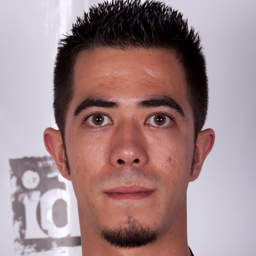

noisy measurement


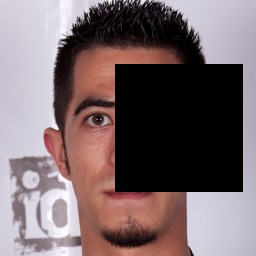

torch.Size([1, 3, 256, 256])


In [8]:
h = 256
w = 256
hcrop, wcrop = h//2, w//2
corner_top, corner_left = h//4, int(0.45*w)
mask = torch.ones((1,3,256, 256), device=device)
mask[:,:,corner_top:corner_top+hcrop,corner_left:corner_left+wcrop] = 0

def linear_operator(x):
  x = x*mask-(1-mask)
  return(x)

idx = 12
x_true_pil = Image.open('images/ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')
x_true = pilimg_to_tensor(x_true_pil)
print(x_true.device)
print("original image", str(idx).zfill(5)+'.png')
display_as_pilimg(x_true)

sigma_noise = 0

y = linear_operator(x_true.clone()) + sigma_noise * mask * torch.randn_like(x_true)
print("noisy measurement")
display_as_pilimg(y);

print(y.size())


 10%|▉         | 98/999 [00:05<00:48, 18.51it/s]

Iteration : 900


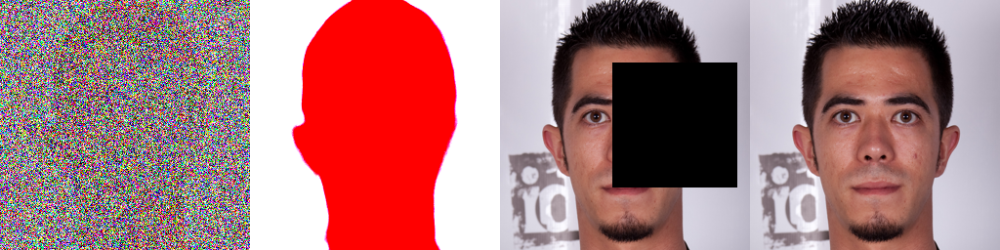

 20%|█▉        | 198/999 [00:10<00:43, 18.48it/s]

Iteration : 800


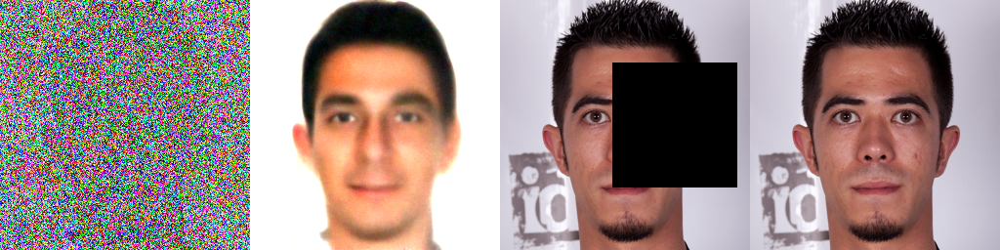

 30%|██▉       | 298/999 [00:16<00:38, 18.25it/s]

Iteration : 700


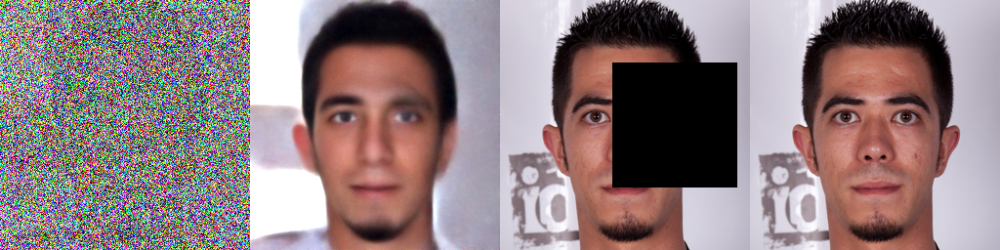

 40%|███▉      | 398/999 [00:21<00:32, 18.24it/s]

Iteration : 600


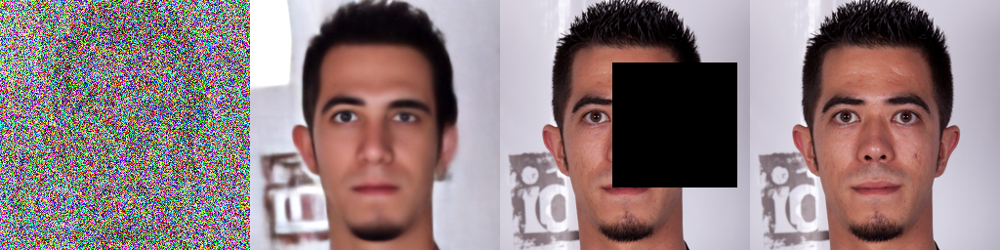

 50%|████▉     | 498/999 [00:27<00:27, 18.20it/s]

Iteration : 500


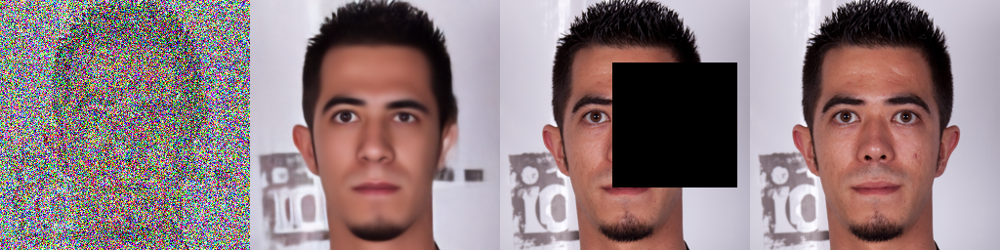

 60%|█████▉    | 598/999 [00:32<00:22, 18.10it/s]

Iteration : 400


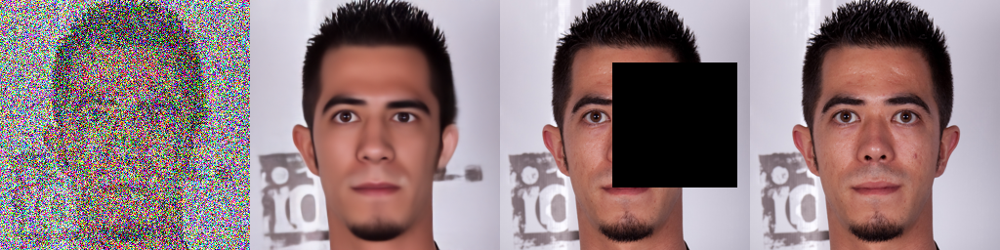

 70%|██████▉   | 698/999 [00:38<00:16, 18.10it/s]

Iteration : 300


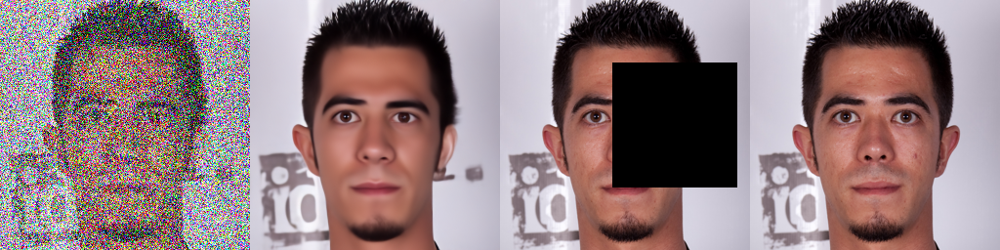

 80%|███████▉  | 798/999 [00:43<00:11, 18.06it/s]

Iteration : 200


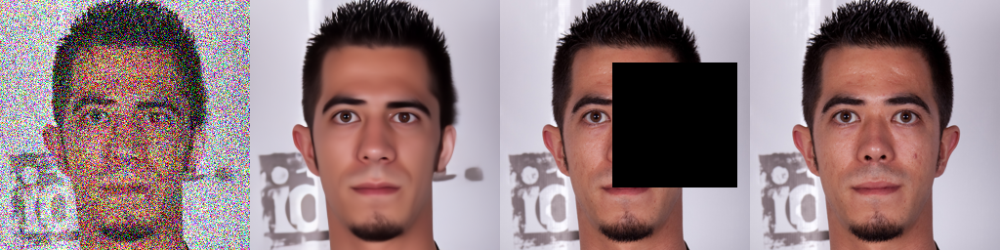

 90%|████████▉ | 898/999 [00:49<00:05, 17.73it/s]

Iteration : 100


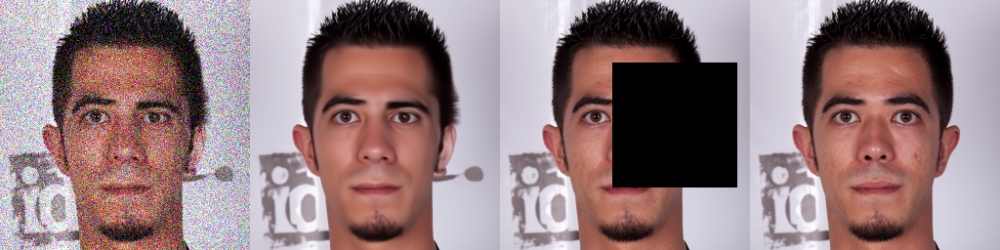

100%|█████████▉| 998/999 [00:55<00:00, 18.02it/s]

Iteration : 0


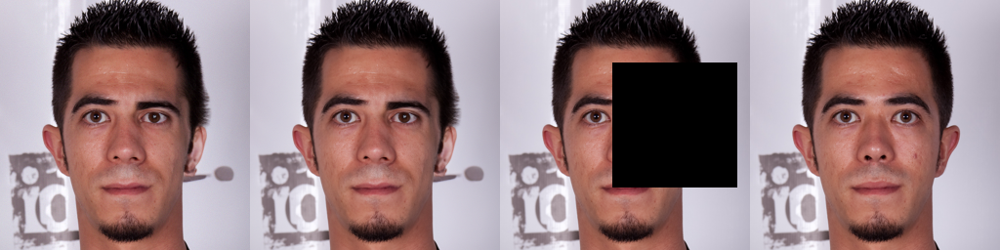

100%|██████████| 999/999 [00:55<00:00, 18.11it/s]


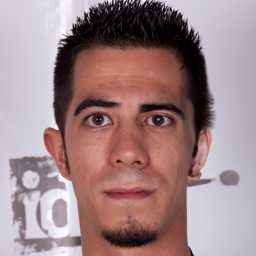

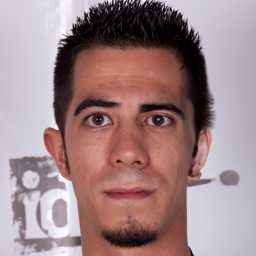

In [18]:
display_as_pilimg(ddpm.posterior_sampling(linear_operator, y, x_true,1, show_steps=True, vis_y=y))

In [9]:
from ddrm.functions.denoising import efficient_generalized_steps
import torch
from tqdm import tqdm
import torchvision.utils as tvu
import os

class DDRM:
    def __init__(self, model):
        self.num_timesteps = 1000
        self.reversed_time_steps = np.arange(self.num_timesteps)[::-1]
        beta_start = 0.0001
        beta_end = 0.02
        betas = np.linspace(
            beta_start, beta_end, self.num_timesteps, dtype=np.float64
        )
        betas = self.betas = torch.from_numpy(betas).float().to(device)
        self.num_timesteps = betas.shape[0]

        alphas = 1.0 - betas
        alphas_cumprod = alphas.cumprod(dim=0)
        alphas_cumprod_prev = torch.cat(
            [torch.ones(1).to(device), alphas_cumprod[:-1]], dim=0
        )
        self.alphas_cumprod_prev = alphas_cumprod_prev
        self.model = model
        self.imgshape = (1,3,256,256)


    def compute_alpha(self,beta, t):
        beta = torch.cat([torch.zeros(1).to(beta.device), beta], dim=0)
        a = (1 - beta).cumprod(dim=0).index_select(0, t + 1).view(-1, 1, 1, 1)
        return a

    def efficient_generalized_steps(self,x, seq, model, b, H_funcs, y_0, sigma_0, etaB, etaA, etaC, cls_fn=None, classes=None):
        with torch.no_grad():
            #setup vectors used in the algorithm
            singulars = H_funcs.singulars()
            Sigma = torch.zeros(x.shape[1]*x.shape[2]*x.shape[3], device=x.device)
            Sigma[:singulars.shape[0]] = singulars
            U_t_y = H_funcs.Ut(y_0)
            Sig_inv_U_t_y = U_t_y / singulars[:U_t_y.shape[-1]]

            #initialize x_T as given in the paper
            largest_alphas = self.compute_alpha(b, (torch.ones(x.size(0)) * seq[-1]).to(x.device).long())
            largest_sigmas = (1 - largest_alphas).sqrt() / largest_alphas.sqrt()
            large_singulars_index = torch.where(singulars * largest_sigmas[0, 0, 0, 0] > sigma_0)
            inv_singulars_and_zero = torch.zeros(x.shape[1] * x.shape[2] * x.shape[3]).to(singulars.device)
            inv_singulars_and_zero[large_singulars_index] = sigma_0 / singulars[large_singulars_index]
            inv_singulars_and_zero = inv_singulars_and_zero.view(1, -1)     

            # implement p(x_T | x_0, y) as given in the paper
            # if eigenvalue is too small, we just treat it as zero (only for init) 
            init_y = torch.zeros(x.shape[0], x.shape[1] * x.shape[2] * x.shape[3]).to(x.device)
            init_y[:, large_singulars_index[0]] = U_t_y[:, large_singulars_index[0]] / singulars[large_singulars_index].view(1, -1)
            init_y = init_y.view(*x.size())
            remaining_s = largest_sigmas.view(-1, 1) ** 2 - inv_singulars_and_zero ** 2
            remaining_s = remaining_s.view(x.shape[0], x.shape[1], x.shape[2], x.shape[3]).clamp_min(0.0).sqrt()
            init_y = init_y + remaining_s * x
            init_y = init_y / largest_sigmas
            
            #setup iteration variables
            x = H_funcs.V(init_y.view(x.size(0), -1)).view(*x.size())
            n = x.size(0)
            seq_next = [-1] + list(seq[:-1])
            x0_preds = []
            xs = [x]

            #iterate over the timesteps
            for i, j in tqdm(zip(reversed(seq), reversed(seq_next))):
                t = (torch.ones(n) * i).to(x.device)
                next_t = (torch.ones(n) * j).to(x.device)
                at = self.compute_alpha(b, t.long())
                at_next = self.compute_alpha(b, next_t.long())
                xt = xs[-1].to('cuda')
                if cls_fn == None:
                    et = model(xt, t)
                else:
                    et = model(xt, t, classes)
                    et = et[:, :3]
                    et = et - (1 - at).sqrt()[0,0,0,0] * cls_fn(x,t,classes)
                
                if et.size(1) == 6:
                    et = et[:, :3]
                
                x0_t = (xt - et * (1 - at).sqrt()) / at.sqrt()

                #variational inference conditioned on y
                sigma = (1 - at).sqrt()[0, 0, 0, 0] / at.sqrt()[0, 0, 0, 0]
                sigma_next = (1 - at_next).sqrt()[0, 0, 0, 0] / at_next.sqrt()[0, 0, 0, 0]
                xt_mod = xt / at.sqrt()[0, 0, 0, 0]
                V_t_x = H_funcs.Vt(xt_mod)
                SVt_x = (V_t_x * Sigma)[:, :U_t_y.shape[1]]
                V_t_x0 = H_funcs.Vt(x0_t)
                SVt_x0 = (V_t_x0 * Sigma)[:, :U_t_y.shape[1]]

                falses = torch.zeros(V_t_x0.shape[1] - singulars.shape[0], dtype=torch.bool, device=xt.device)
                cond_before_lite = singulars * sigma_next > sigma_0
                cond_after_lite = singulars * sigma_next < sigma_0
                cond_before = torch.hstack((cond_before_lite, falses))
                cond_after = torch.hstack((cond_after_lite, falses))

                std_nextC = sigma_next * etaC
                sigma_tilde_nextC = torch.sqrt(sigma_next ** 2 - std_nextC ** 2)

                std_nextA = sigma_next * etaA
                sigma_tilde_nextA = torch.sqrt(sigma_next**2 - std_nextA**2)
                
                diff_sigma_t_nextB = torch.sqrt(sigma_next ** 2 - sigma_0 ** 2 / singulars[cond_before_lite] ** 2 * (etaB ** 2))

                #missing pixels
                Vt_xt_mod_next = V_t_x0 + sigma_tilde_nextC * H_funcs.Vt(et) + std_nextC * torch.randn_like(V_t_x0)

                #less noisy than y (after)
                Vt_xt_mod_next[:, cond_after] = \
                    V_t_x0[:, cond_after] + sigma_tilde_nextA * ((U_t_y - SVt_x0) / sigma_0)[:, cond_after_lite] + std_nextA * torch.randn_like(V_t_x0[:, cond_after])
                
                #noisier than y (before)
                Vt_xt_mod_next[:, cond_before] = \
                    (Sig_inv_U_t_y[:, cond_before_lite] * etaB + (1 - etaB) * V_t_x0[:, cond_before] + diff_sigma_t_nextB * torch.randn_like(U_t_y)[:, cond_before_lite])

                #aggregate all 3 cases and give next prediction
                xt_mod_next = H_funcs.V(Vt_xt_mod_next)
                xt_next = (at_next.sqrt()[0, 0, 0, 0] * xt_mod_next).view(*x.shape)

                x0_preds.append(x0_t.to('cpu'))
                xs.append(xt_next.to('cpu'))


        return xs, x0_preds

    def sample_image(self, x, model, H_funcs, y_0, sigma_0, eta, etaB, skip=1, last=True, cls_fn=None, classes=None):
            seq = range(0, self.num_timesteps, skip)
            
            x = self.efficient_generalized_steps(x, seq, model, self.betas, H_funcs, y_0, sigma_0, \
                etaB=etaB, etaA=eta, etaC=eta, cls_fn=cls_fn, classes=classes)
            if last:
                x = x[0][-1]
            return x

In [13]:
mask=mask.squeeze()[0].flatten()
missing_r = torch.nonzero(mask == 0).long().reshape(-1)*3
missing_g = missing_r + 1
missing_b = missing_g + 1
missing1 = torch.cat([missing_r, missing_g, missing_b], dim=0)
H_funcs_inp = Inpainting(3, 256, missing1, device)
missing_r = torch.randperm(256**2)[:256**2 // 2].to(device).long() * 3
missing_g = missing_r + 1
missing_b = missing_g + 1
missing = torch.cat([missing_r, missing_g, missing_b], dim=0)
H_funcs_inp_random = Inpainting(3, 256, missing,device)
sigma = 10
pdf = lambda x: torch.exp(torch.Tensor([-0.5 * (x/sigma)**2]))
kernel = torch.Tensor([pdf(-2), pdf(-1), pdf(0), pdf(1), pdf(2)]).to(device)
H_funcs_gaussian_blur = Deblurring(kernel / kernel.sum(),3, 256, device)
H_funcs_color = Colorization(256, device)
H_funcs_SR8 = SuperResolution(3, 256, 8,device)
H_funcs_SR16 = SuperResolution(3, 256, 16,device)
H_funcs_denoising = Denoising(3, 256, device)
list_H_funcs = [H_funcs_inp,H_funcs_inp_random, H_funcs_gaussian_blur, H_funcs_SR8, H_funcs_SR16]
list_H_names= ['Inpainting','Inpainting', 'Deblurring', 'SuperResolution8', 'SuperResolution16']
list_x_true=[pilimg_to_tensor(Image.open('images/ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')) for idx in [12,200]]

In [15]:
ddrm=DDRM(model)

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import random


def evaluate_stochasticity(list_x_true, list_H, list_H_names, model, sigma_0, eta, etaB):
    num_transforms = len(list_H)
    num_img = len(list_x_true)
    num_samples = 5  # Adjust this number to match your desired samples

    # Définir le nombre total de colonnes pour les images : Originale, Dégradée, Moyenne, Ecart-Type, + échantillons
    num_columns = 4 + num_samples  # pour chaque transformation

    # Créer une figure avec des sous-graphiques dans une grille
    # Le nombre total de lignes est égal au nombre d'images multiplié par le nombre de transformations
    fig, axs = plt.subplots(num_img * num_transforms, num_columns, figsize=(2 * num_columns, 2 * num_img * num_transforms))

    # Assurer que axs est toujours un tableau bidimensionnel
    if num_img * num_transforms == 1:
        axs = np.array([[axs]])

    for i, (H_func, H_name) in enumerate(zip(list_H, list_H_names)):
        for j, x_true in enumerate(list_x_true):
            # Calculer l'index de ligne actuel dans la grille de sous-graphiques
            current_row = i * num_img + j

            # Afficher l'image originale
            axs[current_row, 0].imshow(to_pilimg(x_true.squeeze()))
            axs[current_row, 0].axis('off')
            if j == 0 and i==0:
                axs[current_row, 0].set_title('Original')

            # Générer et afficher l'image dégradée
            y_0 = H_func.H(x_true)
            y = recover(y_0, H_func, sigma_0, H_name)  # Supposons que cette fonction existe
            y_0+=torch.randn_like(y_0)*sigma_0
            axs[current_row, 1].imshow(to_pilimg(y.squeeze()))
            axs[current_row, 1].axis('off')
            if j == 0:
                axs[current_row, 1].set_title(H_name)

            # Générer les images reconstruites (simulé ici par des images aléatoires)
            reconstructions = []
            for k in range(num_samples):
                x_reconstructed = ddrm.sample_image(x_true, model, H_func, y_0, sigma_0, eta, etaB, skip=10, last=True)
                reconstructions.append(to_pilimg(x_reconstructed.squeeze().clamp(-1, 1)))

            # Convert to PIL images and display
            np_images = [np.array(pil_img) for pil_img in reconstructions]

            # Compute mean and standard deviation images
            stacked_images = np.stack(np_images, axis=0)
            mean_image = np.mean(stacked_images, axis=0).astype(np.uint8)
            std_dev = np.std(stacked_images, axis=0)
            scaled_std_dev = np.clip(std_dev * 4, 0, 255).astype(np.uint8)  # Scale std deviation for visibility

            # Afficher la moyenne et l'écart-type des reconstructions (simulé ici)
            # Vous devez calculer ces images à partir de vos données réelles
            axs[current_row, 7].imshow(mean_image)  # Placeholder pour l'image moyenne
            axs[current_row, 7].axis('off')
            if j == 0 and i==0:
                axs[current_row, 7].set_title('Mean')

            axs[current_row, 8].imshow(scaled_std_dev)  # Placeholder pour l'image d'écart-type
            axs[current_row, 8].axis('off')
            if j == 0 and i==0:
                axs[current_row, 8].set_title('Std (x4)')

            # Afficher les échantillons de reconstruction
            for k, rec_img in enumerate(random.sample(np_images, 5)):
                axs[current_row, 2+k].imshow(rec_img)  # Placeholder pour les échantillons de reconstruction
                axs[current_row, 2+k].axis('off')
                if j == 0 and k == 0 and i==0:
                    axs[current_row, 4+k].set_title('Generated samples', loc='center')

            # Si c'est la première ligne d'une nouvelle transformation, ajouter le nom de la transformation sur l'axe des y
            if j == 0:
                axs[current_row, 0].set_ylabel(H_name, rotation=1)

    plt.tight_layout()
    plt.show()


100it [00:02, 36.12it/s]
100it [00:02, 35.70it/s]
20it [00:00, 36.07it/s]

100it [00:02, 35.91it/s]
100it [00:02, 36.07it/s]
100it [00:02, 36.09it/s]
100it [00:02, 36.08it/s]
100it [00:02, 35.87it/s]
100it [00:02, 36.03it/s]
100it [00:02, 35.90it/s]
100it [00:02, 35.81it/s]
100it [00:02, 36.03it/s]
100it [00:02, 36.22it/s]
100it [00:02, 36.48it/s]
100it [00:02, 35.80it/s]
100it [00:02, 35.74it/s]
100it [00:02, 35.75it/s]
100it [00:02, 35.87it/s]
100it [00:02, 35.65it/s]
100it [00:02, 35.56it/s]
100it [00:02, 35.71it/s]
100it [00:02, 35.30it/s]
100it [00:02, 35.37it/s]
100it [00:02, 35.51it/s]
100it [00:02, 35.37it/s]
100it [00:02, 35.29it/s]
100it [00:02, 35.19it/s]
100it [00:02, 35.26it/s]
100it [00:02, 35.25it/s]
100it [00:02, 35.22it/s]
100it [00:02, 35.71it/s]
100it [00:03, 32.05it/s]
100it [00:03, 32.05it/s]
100it [00:03, 32.57it/s]
100it [00:03, 32.56it/s]
100it [00:03, 32.51it/s]
100it [00:03, 32.62it/s]
100it [00:03, 32.44it/s]
100it [00:03, 32.66it/s]
100it [00:03, 32.57it/s]
100it [00:03, 32.50it/s]
100it [00:03, 25.48it/s]
100it [00:03, 25.54it/s]


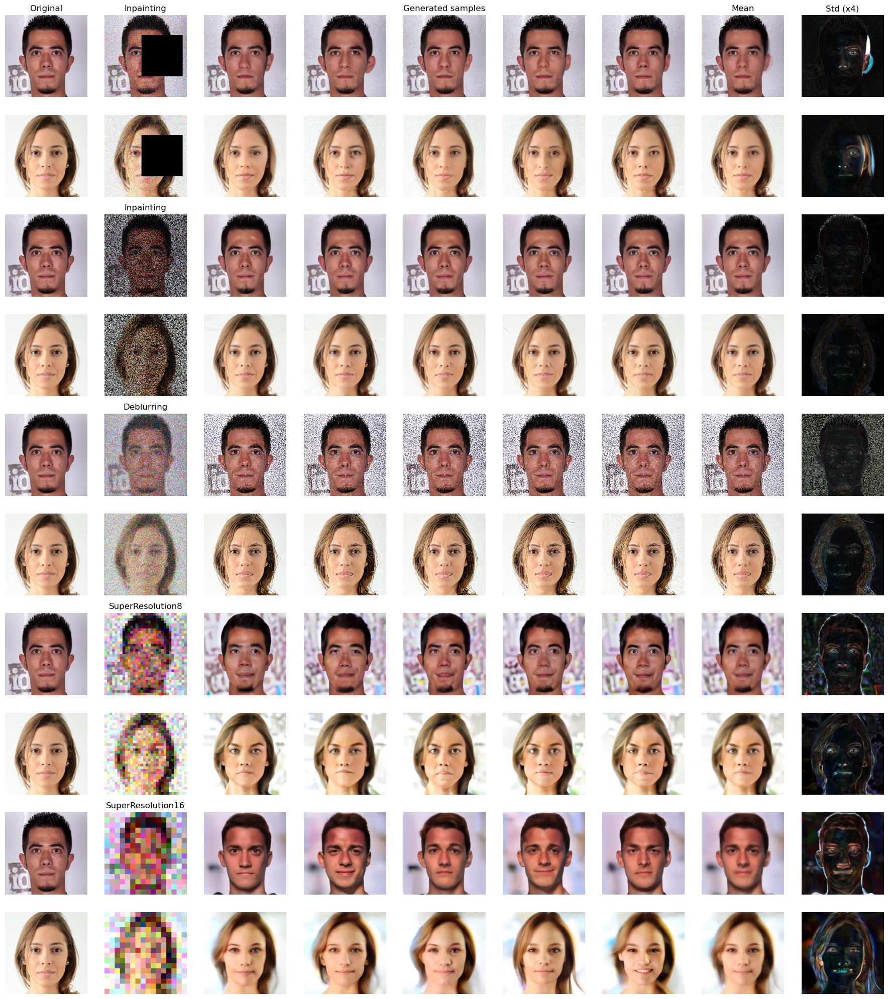

In [19]:
evaluate_stochasticity(list_x_true, list_H_funcs, list_H_names, model, 0.3, 0.85, 1)

In [20]:
def mypsnr(x,y):
  x=((x + 1) / 2 * 255).astype(np.uint8)
  y=((y + 1) / 2 * 255).astype(np.uint8)
  error = torch.mean((x-y)**2).item()
  psnr = 10*np.log10(2**2/error)
  return(psnr)

def evaluate_metrics_ddrm(H_func, H_name, list_index,model, sigma_0, eta, etaB,skip):
    list_psnr = []
    list_x_reconstructed=[]
    list_x_true=[]
    list_y_0=[]

    for idx in list_index:
        x_true_pil = Image.open('images/ffhq256-1k-validation/'+str(idx).zfill(5)+'.png')
        x_true = pilimg_to_tensor(x_true_pil)
        y_0 = H_func.H(x_true)
        list_y_0.append(y_0)
        list_x_true.append(x_true)
        
        x_reconstructed = ddrm.sample_image(x_true, model, H_func, y_0, sigma_0, eta, etaB, skip, last=True)
        list_x_reconstructed.append(x_reconstructed)
        psnr = mypsnr(x_true, x_reconstructed)
        list_psnr.append(psnr)
    return list_psnr, list_x_reconstructed, list_x_true, list_y_0

        

H_funcs_inp = Inpainting(3, 256, missing1, device)

In [69]:
idx= random.sample(range(1000), 2)
evaluate_metrics(H_funcs_inp,'Inpainting', idx,model, 0.05, 0.85, 1,10)

NameError: name 'evaluate_metrics' is not defined

In [ ]:



def evaluate_nfe(list_x_true, list_H, list_H_names, list_nfe, model, sigma_0, eta, etaB):
    num_transforms = len(list_H)
    num_img = len(list_x_true)
    num_samples = 5  # Adjust this number to match your desired samples

    # Définir le nombre total de colonnes pour les images : Originale, Dégradée, Moyenne, Ecart-Type, + échantillons
    num_columns = 4 + num_samples  # pour chaque transformation

    # Créer une figure avec des sous-graphiques dans une grille
    # Le nombre total de lignes est égal au nombre d'images multiplié par le nombre de transformations
    fig, axs = plt.subplots(num_img * num_transforms, num_columns, figsize=(2 * num_columns, 2 * num_img * num_transforms))

    # Assurer que axs est toujours un tableau bidimensionnel
    if num_img * num_transforms == 1:
        axs = np.array([[axs]])

    for i, (H_func, H_name) in enumerate(zip(list_H, list_H_names)):
        for j, x_true in enumerate(list_x_true):
            # Calculer l'index de ligne actuel dans la grille de sous-graphiques
            current_row = i * num_img + j

            # Afficher l'image originale
            axs[current_row, 0].imshow(to_pilimg(x_true.squeeze()))
            axs[current_row, 0].axis('off')
            if j == 0 and i==0:
                axs[current_row, 0].set_title('Original')

            # Générer et afficher l'image dégradée
            y_0 = H_func.H(x_true)
            y = recover(y_0, H_func, sigma_0, H_name)  # Supposons que cette fonction existe
            axs[current_row, 1].imshow(to_pilimg(y.squeeze()))
            axs[current_row, 1].axis('off')
            if j == 0:
                axs[current_row, 1].set_title(H_name)

            # Générer les images reconstruites (simulé ici par des images aléatoires)
            reconstructions = []
            for k in range(num_samples):
                x_reconstructed = ddrm.sample_image(x_true, model, H_func, y_0, sigma_0, eta, etaB, skip=10, last=True)
                reconstructions.append(to_pilimg(x_reconstructed.squeeze().clamp(-1, 1)))

            # Convert to PIL images and display
            np_images = [np.array(pil_img) for pil_img in reconstructions]

            # Compute mean and standard deviation images
            stacked_images = np.stack(np_images, axis=0)
            mean_image = np.mean(stacked_images, axis=0).astype(np.uint8)
            std_dev = np.std(stacked_images, axis=0)
            scaled_std_dev = np.clip(std_dev * 4, 0, 255).astype(np.uint8)  # Scale std deviation for visibility

            # Afficher la moyenne et l'écart-type des reconstructions (simulé ici)
            # Vous devez calculer ces images à partir de vos données réelles
            axs[current_row, 7].imshow(mean_image)  # Placeholder pour l'image moyenne
            axs[current_row, 7].axis('off')
            if j == 0 and i==0:
                axs[current_row, 7].set_title('Mean')

            axs[current_row, 8].imshow(scaled_std_dev)  # Placeholder pour l'image d'écart-type
            axs[current_row, 8].axis('off')
            if j == 0 and i==0:
                axs[current_row, 8].set_title('Std (x4)')

            # Afficher les échantillons de reconstruction
            for k, rec_img in enumerate(random.sample(np_images, 5)):
                axs[current_row, 2+k].imshow(rec_img)  # Placeholder pour les échantillons de reconstruction
                axs[current_row, 2+k].axis('off')
                if j == 0 and k == 0 and i==0:
                    axs[current_row, 4+k].set_title('Generated samples', loc='center')

            # Si c'est la première ligne d'une nouvelle transformation, ajouter le nom de la transformation sur l'axe des y
            if j == 0:
                axs[current_row, 0].set_ylabel(H_name, rotation=1)

    plt.tight_layout()
    plt.show()
